## **컨브넷 이미지 시각화1**

중간 층의 활성화 시각화는 어떤 입력이 주어졌을 때 네트워크에 있는 여러 합성곱과 풀링 층이 출력하는 특성 맵을 그리는 것이다.

### **[결과물을 보고 주목할 내용]**
* 상위 층으로 갈 수록 활성화는 점점 더 추상적으로 되고 시각적으로 이해하기 어려워진다. '고양이 귀'와 '고양이 눈'처럼 고수준 개념을 인코딩하기 시작한다. 상위층의 표현은 이미지 시각적 콘텐츠에 관한 정보가 점점 줄어들고, 이미지의 클래스에 관한 정보가 점점 증가한다.

* 비어있는 활성화가 층이 깊어짐에 따라 늘어난다. 첫 번째 층에서는 모든 필터가 입력 이미지에 활성화 되었지만 층을 올라가면서 활성화 되지 않는 필터들이 생긴다. 필터에 인코딩된 패턴이 입력 이미지에 나타나지 않았다는 것을 의미한다. (이것은 상위 필터가 학습하는 패턴이 일반적인 패턴이 아닌, 클래스에 최적화 된 고수준화 된 패턴이기 때문이다.)

* 반복적인 변환을 통해 관계없는 정보를 걸러 내고, 유용한 정보는 강조되고 개선된다.








/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:47: RuntimeWarning: invalid value encountered in true_divide


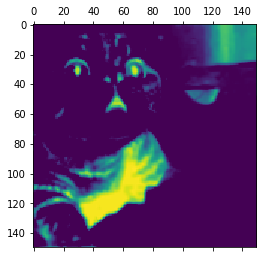

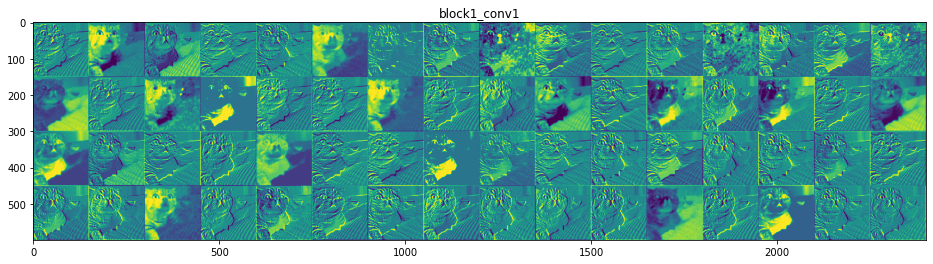

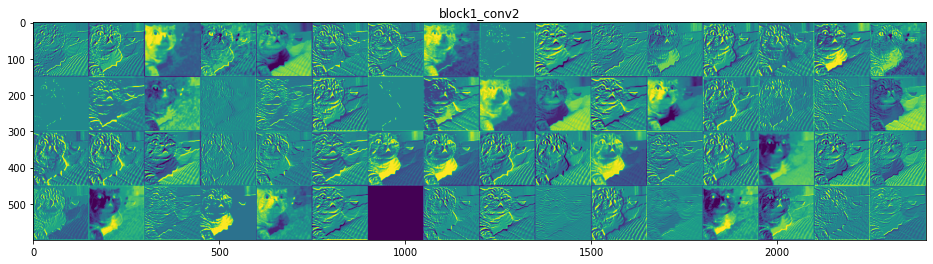

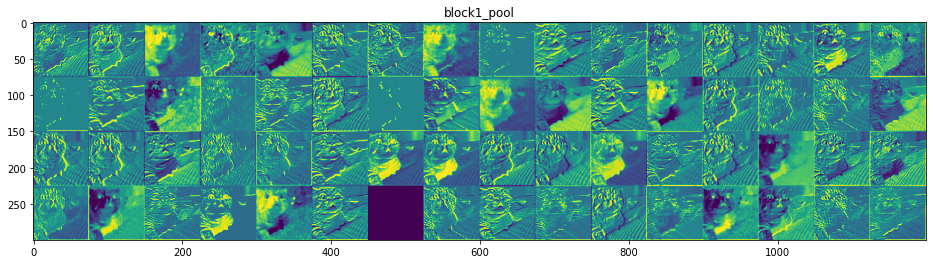

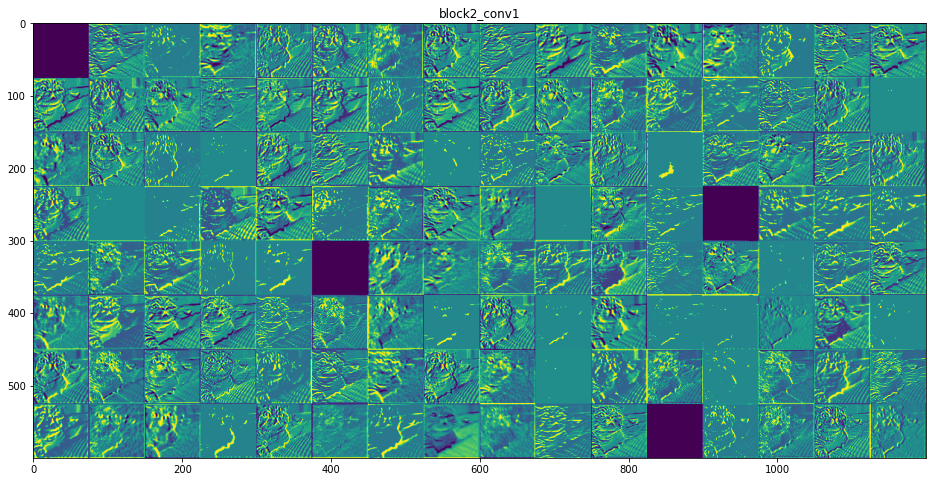

...

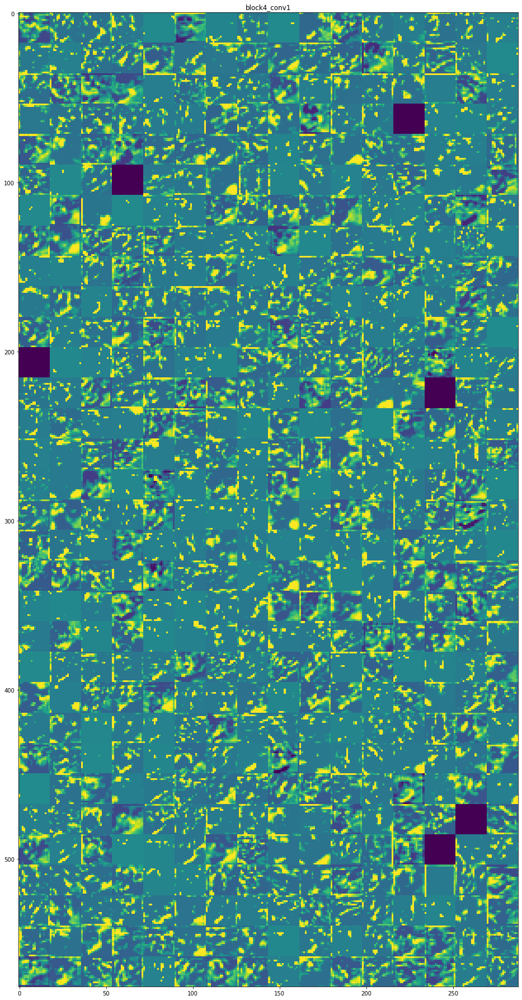

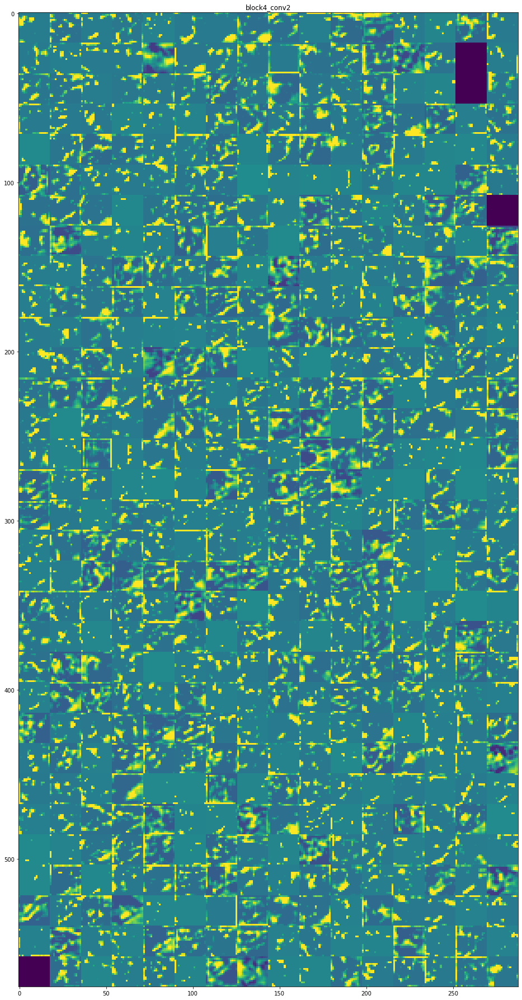

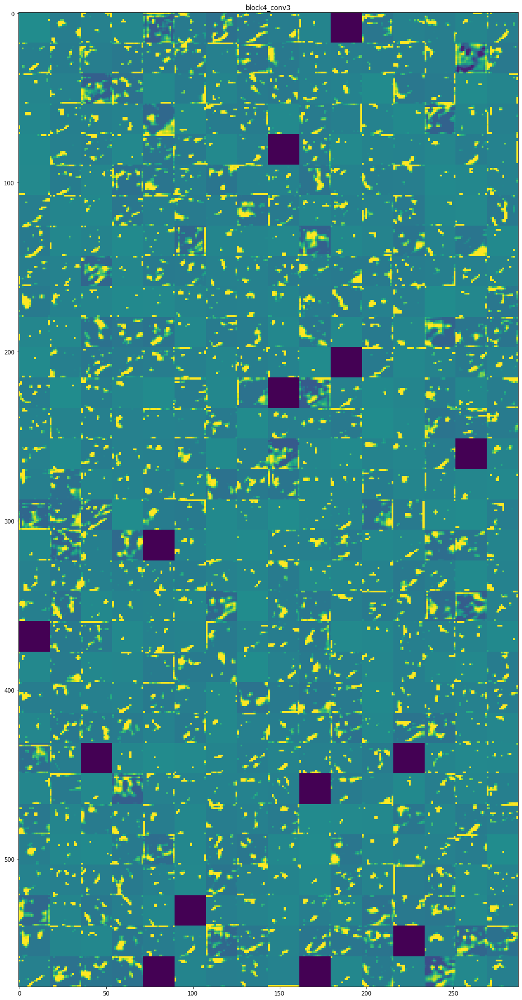

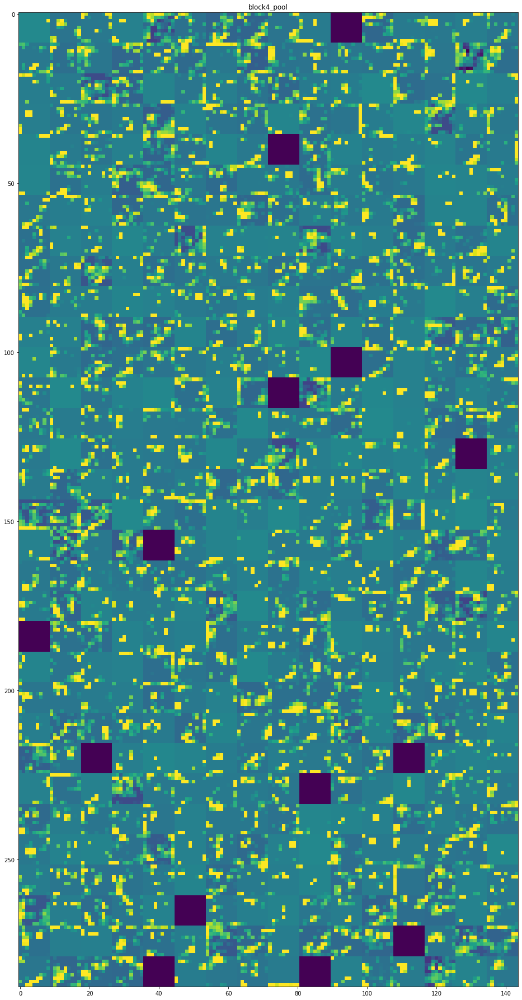

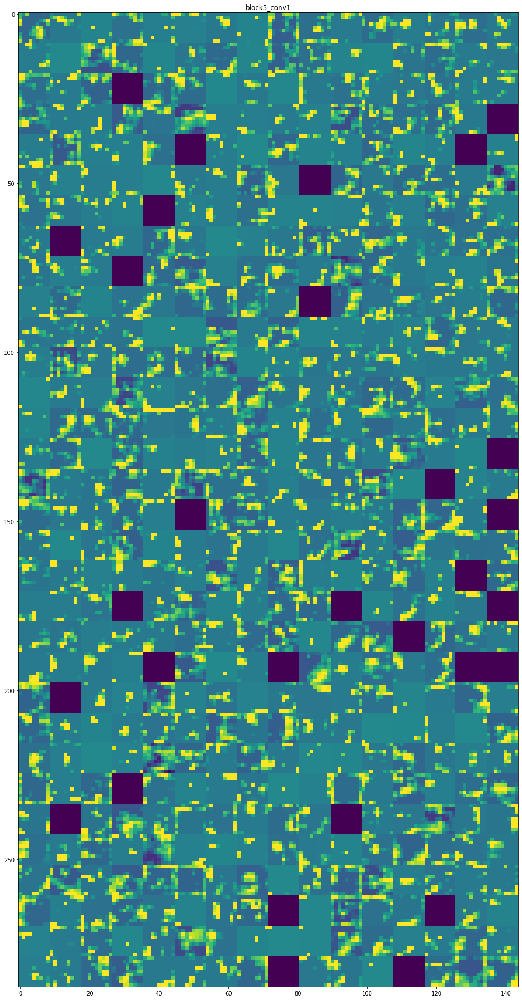

In [21]:
import os
import matplotlib.pyplot as plt
import numpy as np

from tensorflow.keras.applications import VGG16
from tensorflow.keras.preprocessing import image
from tensorflow.keras import models
from keras import backend as K # 케라스 백엔드 함수

img_path = '/content/cat.jpg'

img = image.load_img(img_path, target_size=(150, 150))
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

img_tensor /= 255.

model = VGG16(weights = 'imagenet', include_top = False)
layer_outputs = [layer.output for layer in model.layers[1:16]]
activation_model = models.Model(inputs = [model.input], outputs = layer_outputs)

activations = activation_model.predict(img_tensor)
first_layer_activation = activations[0]

plt.matshow(first_layer_activation[0, :, :, 19], cmap='viridis')

layer_names = []
for layer in model.layers[1:16]:
  layer_names.append(layer.name)

images_per_row = 16

# 네트워크의 모든 활성화를 출력
for layer_name, layer_activation in zip(layer_names, activations):
  n_features = layer_activation.shape[-1]
  size = layer_activation.shape[1]
  n_cols = n_features // images_per_row

  display_grid = np.zeros((size * n_cols, images_per_row * size))

  for col in range(n_cols):
    for row in range(images_per_row):
      channel_image = layer_activation[0, :, :, col * images_per_row + row]

      # 그래프로 잘 표현하기 위해 전처리
      channel_image -= channel_image.mean()
      channel_image /= channel_image.std()
      channel_image *= 64
      channel_image += 128
      channel_image = np.clip(channel_image, 0, 255).astype('uint8')
      display_grid[col * size : (col + 1) * size,
                   row * size : (row + 1) * size] = channel_image

  scale = 1. / size
  plt.figure(figsize = (scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
  plt.title(layer_name)
  plt.grid(False)
  plt.imshow(display_grid, aspect='auto', cmap='viridis')

plt.show()



      